In [1]:
from tkinter import Tk, filedialog
import matplotlib.pyplot as plt
import numpy as np
import nibabel as nib
from scipy.optimize import curve_fit
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
import cv2
import seaborn as sns
from skimage.filters import threshold_otsu
import os
import re


%matplotlib inline  
%config InlineBackend.figure_format = 'svg'

plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['font.size'] = 20
plt.style.use(['seaborn-bright', 'seaborn-paper'])

In [2]:
# Generate a GUI to choose .nii.gz
def select_data_file():
    root = Tk()
    root.withdraw()
    root.attributes("-topmost", True)
    data_file = filedialog.askopenfilename(title="Select NIfTI data file for analysis",
                                           filetypes=(("NIfTI files", "*.nii.gz;*.nii"),("All files", "*")))
    root.destroy()

    if not data_file:
        raise ValueError("Error: input file not given.")

    return data_file

# Mask
def generate_mask(image,size):
    # Threshold
    mask = image > threshold_otsu(image)
    # Close calculation kernel
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size)) 
    # Close calculation to fill the holes
    mask = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    return mask

# Plot
def cal_part(center_x, center_y, radius, ref, map, map_max):
    height, width = map.shape
    roi = np.full((height, width), np.nan)
    cv2.circle(roi, (center_x, center_y), radius, 1, -1)

    # Calculate ROI Map
    map_roi = map*roi
    mean = np.nanmean(map_roi)
    std = np.nanstd(map_roi)
    print('mean = ',mean)
    print('std  = ',std)

    # Plot
    fig, axes = plt.subplots(1,2, figsize=(12,4))

    axes[0].set_title('Reference')
    img_ref = axes[0].imshow(ref, origin='lower', cmap=plt.cm.gray)
    fig.colorbar(img_ref,ax=axes[0])
    circ1 = Circle((center_x, center_y), radius, linewidth=1, edgecolor='r', facecolor='none')
    axes[0].add_patch(circ1)

    axes[1].set_title('Map')
    img_map = axes[1].imshow(map, origin='lower', cmap=plt.cm.hot, vmin=0,vmax=map_max)
    fig.colorbar(img_map,ax=axes[1])
    circ2 = Circle((center_x, center_y), radius, linewidth=1, edgecolor='b', facecolor='none')
    axes[1].add_patch(circ2)

    plt.show()
    plt.tight_layout()

In [18]:
data_file = select_data_file()
data_nii = nib.load(data_file)
print("Reading data  : ", data_file)

# Read resolutions from header of data_nii
header = data_nii.header
resolution = header.get_zooms()
x_pix_dim, y_pix_dim, z_pix_dim = resolution
print("(X,Y,Z) pix dims : ({:.2f}, {:.2f}, {:.2f}) mm".format(x_pix_dim, y_pix_dim, z_pix_dim))
data = data_nii.get_fdata()
display(data.shape)

Reading data  :  E:/Kidney-HepingCheng/20230822/LY140_2/NIFTI/MSE/MSE_e14.nii.gz
(X,Y,Z) pix dims : (0.12, 0.12, 0.50) mm


(256, 172, 35)

# 1. T2加权结构像 (T2_TurboRARE)

In [3]:
data_file = 'E:\\Bolin\\94T\\Kidney-HepingCheng\\20230926_Kidney\\168\\NIFTI\\T2_anat\\ChengHePing_LiJinHua_230926_LY168_E2_P1.nii.gz'
#data_file = 'E:\\Bolin\\94T\\Kidney-HepingCheng\\20230926_Kidney\\167\\NIFTI\\T2_anat\\ChengHePing_LiJinHua_230926_LY167_E6_P1.nii.gz'
#data_file = select_data_file()

data_nii = nib.load(data_file)
print("Reading data  : ", data_file)

data = data_nii.get_fdata()
data = np.transpose(data, (1,0,2))
x_dim, y_dim, z_dim = data.shape
display(data.shape)

# Read resolutions from header of data_nii
header = data_nii.header
resolution = header.get_zooms()
x_pix_dim, y_pix_dim, z_pix_dim = resolution
print("(X,Y,Z) resolution : ({:.2f}, {:.2f}, {:.2f}) mm".format(x_pix_dim, y_pix_dim, z_pix_dim))
#print(header)

Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\T2_anat\ChengHePing_LiJinHua_230926_LY168_E2_P1.nii.gz


(256, 256, 20)

(X,Y,Z) resolution : (0.12, 0.12, 0.70) mm


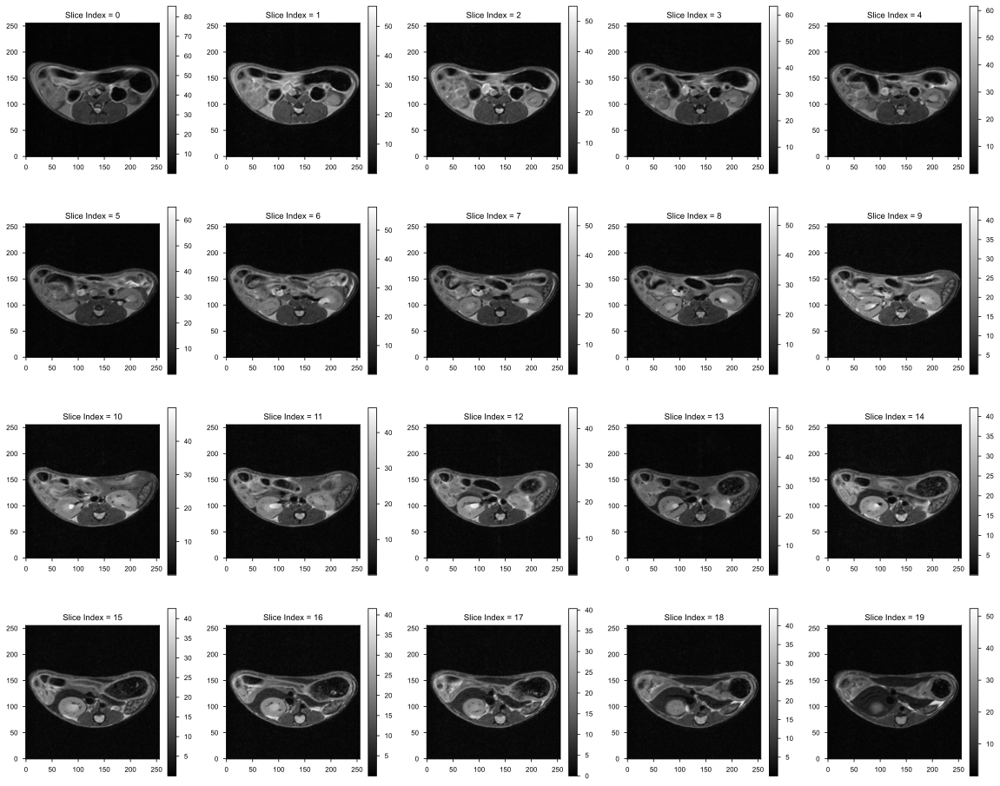

<Figure size 640x440 with 0 Axes>

In [5]:
# Show the Slices
row_set = 4
column_set = 5
fig, axes = plt.subplots(row_set,column_set, figsize=(20,16))
for i in range(z_dim):
    row = int(i // column_set)
    column = int(i - column_set*row)
    fig_s = axes[row,column].imshow(data[:,:,i],origin='lower', cmap=plt.cm.gray)
    fig.colorbar(fig_s,ax=axes[row,column])
    axes[row,column].set_title('Slice Index = '+str(i))

plt.show()
plt.tight_layout()
#fig.savefig('E:\\Bolin\\7T_8Tx\\Relaxation\\20230724_T1_T2\\fig\\MGE_brain1.png')

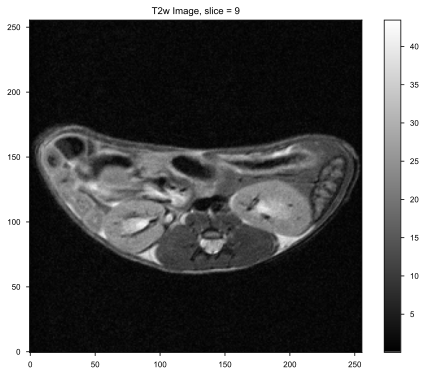

<Figure size 640x440 with 0 Axes>

In [6]:
# Plot
fig, axes = plt.subplots(figsize=(8,6))

img = axes.imshow(data[:,:,9],origin='lower', cmap=plt.cm.gray)
fig.colorbar(img,ax=axes)
title = 'T2w Image, slice = 9'
axes.set_title(title)

plt.show()
plt.tight_layout()

# 2. T2star Map (MGE)


In [7]:
# Import the data
main_path = 'E:\\Bolin\\94T\\Kidney-HepingCheng\\20230926_Kidney\\168\\NIFTI\\MGE\\'
echoes_path = []
for file in os.listdir(main_path):
    if os.path.splitext(file)[1] == '.gz':
        echoes_path.append(main_path+file)
# Arrange the echoes
echoes_path.sort(key=lambda x:float(re.split('_e|\.',x)[1]))
#display(echoes_path)
number_of_echoes = len(echoes_path)

TE_list = np.array([1.86827,3.44427,5.02027,6.59627,8.17227,9.74827,11.3243,12.9003,14.4763,16.0523,17.6283,19.2043], dtype=float)

all_echoes = []
for i in range(len(echoes_path)):
    data_nii = nib.load(echoes_path[i])
    print("Reading data  : ", echoes_path[i])
    data = data_nii.get_fdata()
    # display(data.shape)
    data = np.transpose(data, (1,0,2))
    all_echoes.append(data)

all_echoes = np.array(all_echoes)
print('\n(echo_dim, y_dim, x_dim, z_dim): ',all_echoes.shape)


# Resolution
y_dim, x_dim, z_dim = data.shape
header = data_nii.header
resolution = header.get_zooms()
y_pix_dim, x_pix_dim, z_pix_dim = resolution
print("(X, Y, Z) pix : ({:.2f}, {:.2f}, {:.2f}) mm".format(x_pix_dim, y_pix_dim, z_pix_dim))



Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MGE\ChengHePing_LiJinHua_230926_LY168_E5_P1_e1.86827.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MGE\ChengHePing_LiJinHua_230926_LY168_E5_P1_e3.44427.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MGE\ChengHePing_LiJinHua_230926_LY168_E5_P1_e5.02027.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MGE\ChengHePing_LiJinHua_230926_LY168_E5_P1_e6.59627.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MGE\ChengHePing_LiJinHua_230926_LY168_E5_P1_e8.17227.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MGE\ChengHePing_LiJinHua_230926_LY168_E5_P1_e9.74827.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MGE\ChengHePing_LiJinHua_230926_LY168_E5_P1_e11.3243.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\202309

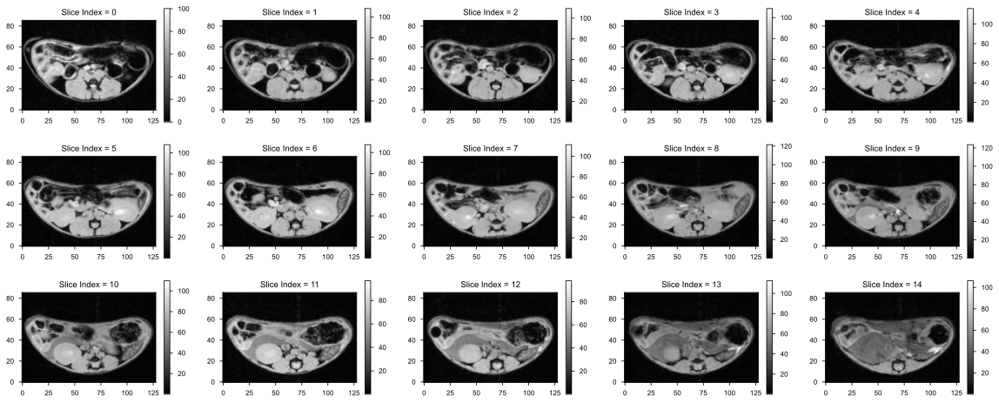

<Figure size 640x440 with 0 Axes>

In [8]:
# Show the Slices
row_set = 3
column_set = 5
fig, axes = plt.subplots(row_set,column_set, figsize=(20,8))
for i in range(z_dim):
    row = int(i // column_set)
    column = int(i - column_set*row)
    fig_s = axes[row,column].imshow(all_echoes[1,:,:,i],origin='lower', cmap=plt.cm.gray)
    fig.colorbar(fig_s,ax=axes[row,column])
    axes[row,column].set_title('Slice Index = '+str(i))

plt.show()
plt.tight_layout()
#fig.savefig('E:\\Bolin\\7T_8Tx\\Relaxation\\20230724_T1_T2\\fig\\MGE_brain1.png')

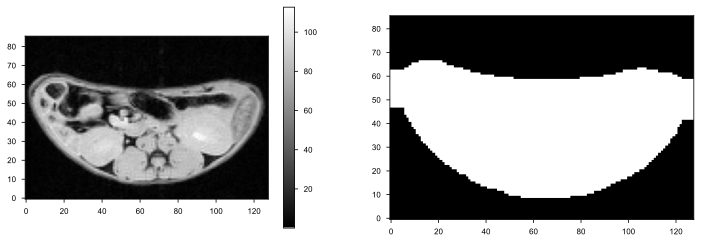

<Figure size 640x440 with 0 Axes>

In [14]:
# Plot: vmax, mask
Slice_index = 6
close_size = 10
all_echoes_slice = all_echoes[:,:,:,Slice_index]
mask = generate_mask(all_echoes_slice[0,:,:],close_size)
all_echoes_slice_mask = mask*all_echoes_slice

fig, axes = plt.subplots(1,2,figsize=(12,4))
img_0 = axes[0].imshow(all_echoes_slice[0,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(img_0,ax=axes[0])
axes[1].imshow(mask,origin='lower', cmap=plt.cm.gray)
plt.show()
plt.tight_layout()

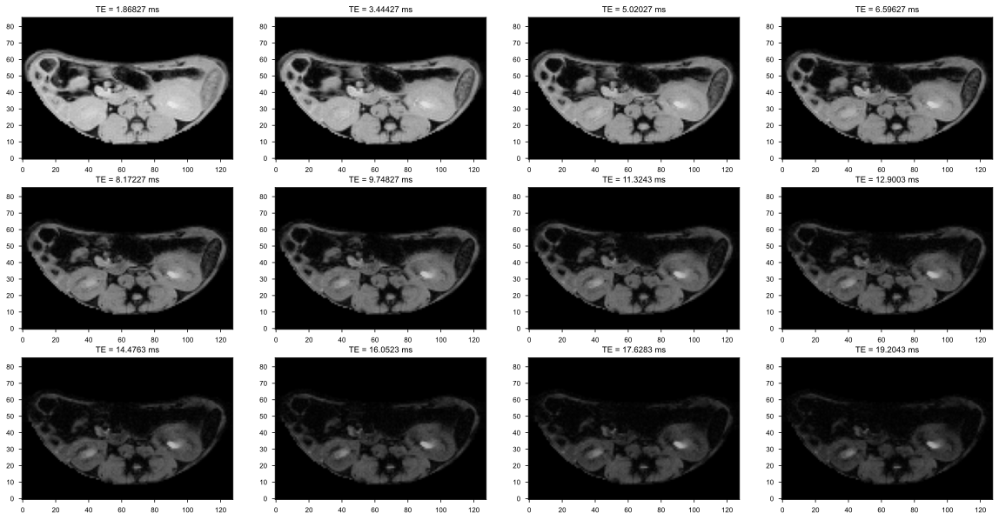

<Figure size 640x440 with 0 Axes>

In [16]:
# Show the Echoes
row_set = 3
column_set = 4
fig, axes = plt.subplots(row_set,column_set, figsize=(20,10))
for i in range(number_of_echoes):
    row = int(i // column_set)
    column = int(i - column_set*row)
    axes[row,column].imshow(all_echoes_slice_mask[i,:,:],origin='lower', cmap=plt.cm.gray, vmin=0, vmax=120)
    axes[row,column].set_title('TE = '+str(TE_list[i])+' ms')

plt.show()
plt.tight_layout()
#fig.savefig('E:\\Bolin\\7T_8Tx\\Relaxation\\20230724_T1_T2\\fig\\MGE_brain1.png')

T2star拟合
$$S=S_0(e^{-\frac{\text{TE}}{T_2^*}}+c)$$

In [17]:
def T2star_function(TE, S0, T2star, const):
    return S0*(np.exp(-TE/T2star)+const)


def T2star_fitting(Intensity_list,TE_list):
    S0_min, S0_max = 0, 200
    T2star_min, T2star_max = 0, 100
    const_min, const_max = -5, 5
    initial_params = [100,50,0]

    if Intensity_list[0]==0:
        params = [0,0,0]
    else:
        try:
            params, _ = curve_fit(T2star_function, TE_list, Intensity_list, bounds=([S0_min,T2star_min, const_min], [S0_max,T2star_max, const_max]),p0=initial_params)
        except RuntimeError:
            params = np.full(len(initial_params), np.nan)

    return params


def T2star_fitting_point(x_pos,y_pos,color,all_echoes,TE_list):
    rect = Rectangle((x_pos, y_pos), 1,1, linewidth=1, edgecolor=color, facecolor=color)
    Intensity_list = np.array([all_echoes[i,y_pos,x_pos] for i in range(len(TE_list))], dtype=float)
    S0_fit, T2star_fit, const_fit = T2star_fitting(Intensity_list,TE_list)

    # Fit curve
    print("T2star = ", T2star_fit)
    print("S0 = ", S0_fit)
    print("const = ", const_fit)
    print('\n')
    TE_fit = np.linspace(min(TE_list)-1, max(TE_list)+1, 200)
    Intensity_fit = T2star_function(TE_fit, S0_fit, T2star_fit, const_fit)
    
    return Intensity_list,Intensity_fit,rect


T2star =  19.93908521514924
S0 =  123.65765868237318
const =  -0.16647859353176633


T2star =  26.064885240442393
S0 =  179.69396688827575
const =  -0.38735936265866105




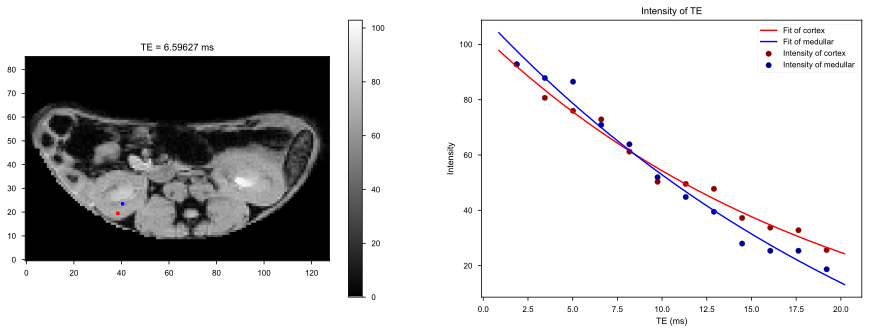

<Figure size 640x440 with 0 Axes>

In [20]:
cortex_x_pos,cortex_y_pos = 38,19
medullar_x_pos,medullar_y_pos = 40,23

cortex_color = 'red'
medullar_color = 'blue'

cortex_intensity,cortex_fit,cortex_rect=T2star_fitting_point(cortex_x_pos,cortex_y_pos,cortex_color,all_echoes_slice_mask,TE_list)
medullar_intensity,medullar_fit,medullar_rect=T2star_fitting_point(medullar_x_pos,medullar_y_pos,medullar_color,all_echoes_slice_mask,TE_list)

cortex_over_medullar_intensity = cortex_intensity/medullar_intensity
cortex_over_medullar_fit = cortex_fit/medullar_fit

TE_fit = np.linspace(min(TE_list)-1, max(TE_list)+1, 200)

# Plot
fig, axes = plt.subplots(1,2, figsize=(15,5))

ref_index = 3
fig_ref = axes[0].imshow(all_echoes_slice_mask[ref_index,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(fig_ref,ax=axes[0])
axes[0].set_title('TE = '+str(TE_list[ref_index])+' ms')
axes[0].add_patch(cortex_rect)
axes[0].add_patch(medullar_rect)

axes[1].scatter(TE_list,cortex_intensity,color='darkred',label='Intensity of cortex')
axes[1].plot(TE_fit,cortex_fit,color=cortex_color,label='Fit of cortex')
axes[1].scatter(TE_list,medullar_intensity,color='darkblue',label='Intensity of medullar')
axes[1].plot(TE_fit,medullar_fit,color=medullar_color,label='Fit of medullar')
axes[1].set_xlabel("TE (ms)")
axes[1].set_ylabel("Intensity")
axes[1].set_title('Intensity of TE')
axes[1].legend()

plt.show()
plt.tight_layout()

In [21]:
# Fit all the pixels (about 1 min)
param_map = np.apply_along_axis(T2star_fitting, 0, all_echoes_slice_mask, TE_list)
T2star_map = param_map[1]

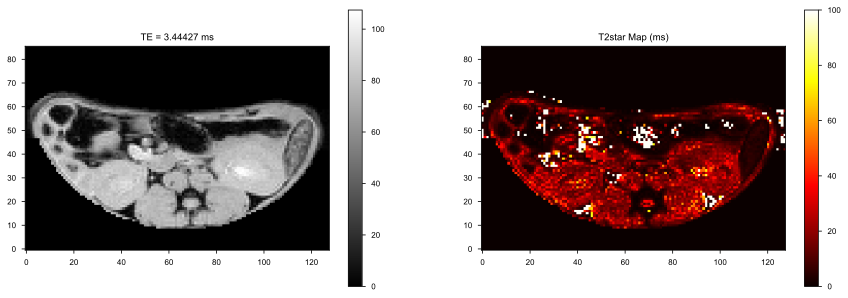

<Figure size 640x440 with 0 Axes>

In [22]:
# Plot
fig, axes = plt.subplots(1,2, figsize=(15,5))

ref_index = 1
fig_te0 = axes[0].imshow(all_echoes_slice_mask[ref_index,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(fig_te0,ax=axes[0])
axes[0].set_title('TE = '+str(TE_list[ref_index])+' ms')

fig_T2map = axes[1].imshow(T2star_map, origin='lower', cmap=plt.cm.hot,vmin=0, vmax=100)
fig.colorbar(fig_T2map,ax=axes[1])
axes[1].set_title('T2star Map (ms)')

plt.show()
plt.tight_layout()

mean =  19.0
std  =  5.737863445837389


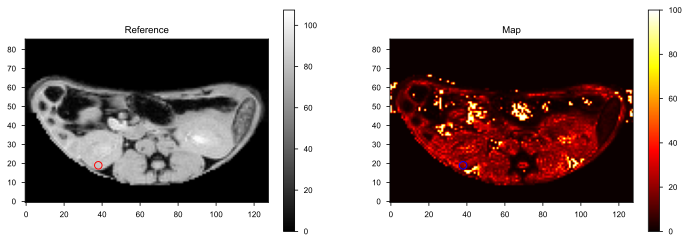

mean =  16.846153846153847
std  =  6.992811186069853


<Figure size 640x440 with 0 Axes>

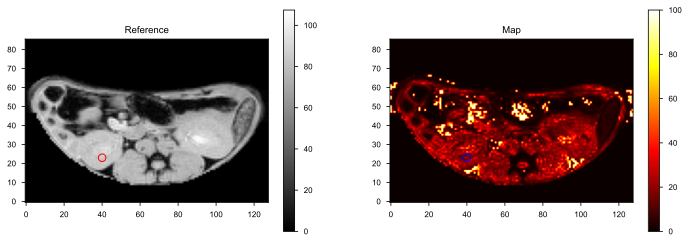

<Figure size 640x440 with 0 Axes>

In [23]:
ref_index = 1
cortex_x_pos,cortex_y_pos,cortex_radius = 38,19,2
medullar_x_pos,medullar_y_pos,medullar_radius = 40,23,2

cal_part(center_x=cortex_x_pos, center_y=cortex_y_pos, radius=cortex_radius, ref=all_echoes_slice_mask[ref_index,:,:], map=T2star_map, map_max=100)
cal_part(center_x=medullar_x_pos, center_y=medullar_y_pos, radius=medullar_radius, ref=all_echoes_slice_mask[ref_index,:,:], map=T2star_map, map_max=100)

# 3. T2 Map (MSE)



In [44]:
# Import the data
main_path = 'E:\\Bolin\\94T\\Kidney-HepingCheng\\20230926_Kidney\\168\\NIFTI\\MSE_TR5000\\'
echoes_path = []
for file in os.listdir(main_path):
    if os.path.splitext(file)[1] == '.gz':
        echoes_path.append(main_path+file)
# Arrange the echoes
#display(echoes_path)
echoes_path.sort(key=lambda x:float(re.split('_e|\.',x)[1]))
#display(echoes_path)
number_of_echoes = len(echoes_path)

TE_list = np.array([10,20,30,40,50,60,70,80,90,100,110,120], dtype=float)

all_echoes = []
for i in range(len(echoes_path)):
    data_nii = nib.load(echoes_path[i])
    print("Reading data  : ", echoes_path[i])
    data = data_nii.get_fdata()
    # display(data.shape)
    data = np.transpose(data, (1,0,2))
    all_echoes.append(data)

all_echoes = np.array(all_echoes)
print('\n(echo_dim, y_dim, x_dim, z_dim): ',all_echoes.shape)


# Resolution
y_dim, x_dim, z_dim = data.shape
header = data_nii.header
resolution = header.get_zooms()
y_pix_dim, x_pix_dim, z_pix_dim = resolution
print("(X, Y, Z) pix : ({:.2f}, {:.2f}, {:.2f}) mm".format(x_pix_dim, y_pix_dim, z_pix_dim))



Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MSE_TR5000\ChengHePing_LiJinHua_230926_LY168_E11_P1_e10.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MSE_TR5000\ChengHePing_LiJinHua_230926_LY168_E11_P1_e20.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MSE_TR5000\ChengHePing_LiJinHua_230926_LY168_E11_P1_e30.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MSE_TR5000\ChengHePing_LiJinHua_230926_LY168_E11_P1_e40.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MSE_TR5000\ChengHePing_LiJinHua_230926_LY168_E11_P1_e50.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MSE_TR5000\ChengHePing_LiJinHua_230926_LY168_E11_P1_e60.nii.gz
Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\MSE_TR5000\ChengHePing_LiJinHua_230926_LY168_E11_P1_e70.nii.gz
Reading data  :  E:\Bolin\94T\Kidn

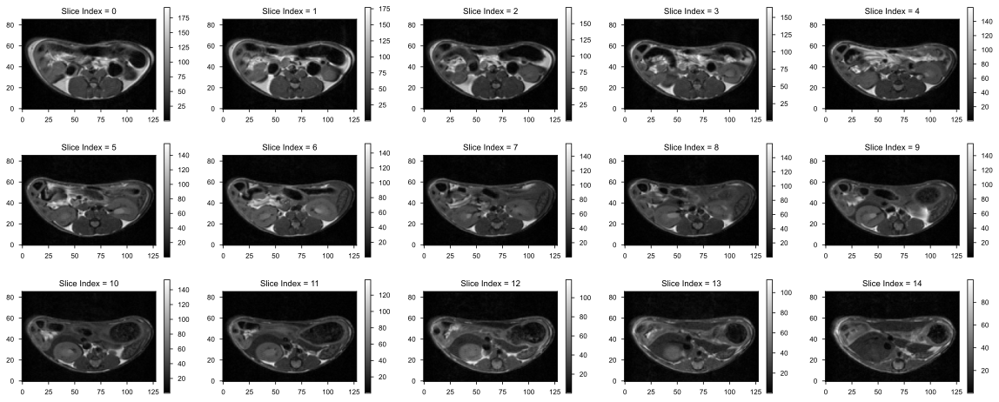

<Figure size 640x440 with 0 Axes>

In [45]:
# Show the Slices
row_set = 3
column_set = 5
fig, axes = plt.subplots(row_set,column_set, figsize=(20,8))
for i in range(z_dim):
    row = int(i // column_set)
    column = int(i - column_set*row)
    fig_s = axes[row,column].imshow(all_echoes[1,:,:,i],origin='lower', cmap=plt.cm.gray)
    fig.colorbar(fig_s,ax=axes[row,column])
    axes[row,column].set_title('Slice Index = '+str(i))

plt.show()
plt.tight_layout()
#fig.savefig('E:\\Bolin\\7T_8Tx\\Relaxation\\20230724_T1_T2\\fig\\MGE_brain1.png')

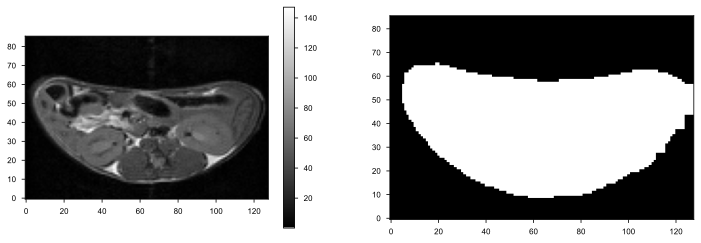

<Figure size 640x440 with 0 Axes>

In [46]:
# Plot: vmax, mask
Slice_index = 6
close_size = 8
all_echoes_slice = all_echoes[:,:,:,Slice_index]
mask = generate_mask(all_echoes_slice[0,:,:],close_size)
all_echoes_slice_mask = mask*all_echoes_slice

fig, axes = plt.subplots(1,2,figsize=(12,4))
img_0 = axes[0].imshow(all_echoes_slice[0,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(img_0,ax=axes[0])
axes[1].imshow(mask,origin='lower', cmap=plt.cm.gray)
plt.show()
plt.tight_layout()

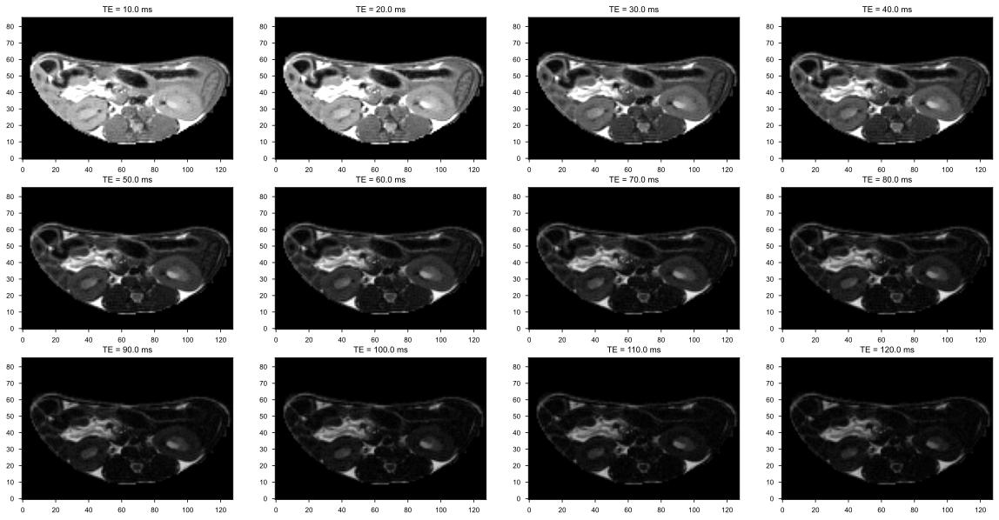

<Figure size 640x440 with 0 Axes>

In [47]:
# Show the Echoes
row_set = 3
column_set = 4
fig, axes = plt.subplots(row_set,column_set, figsize=(20,10))
for i in range(number_of_echoes):
    row = int(i // column_set)
    column = int(i - column_set*row)
    axes[row,column].imshow(all_echoes_slice_mask[i,:,:],origin='lower', cmap=plt.cm.gray, vmin=0, vmax=80)
    axes[row,column].set_title('TE = '+str(TE_list[i])+' ms')

plt.show()
plt.tight_layout()
#fig.savefig('E:\\Bolin\\7T_8Tx\\Relaxation\\20230724_T1_T2\\fig\\MGE_brain1.png')

T2拟合
$$S=S_0(e^{-\frac{\text{TE}}{T_2}}+c)$$

In [48]:
def T2_function(TE, S0, T2, const):
    return S0*(np.exp(-TE/T2)+const)


def T2_fitting(Intensity_list,TE_list):
    S0_min, S0_max = 0, 200
    T2_min, T2_max = 0, 100
    const_min, const_max = -5, 5
    initial_params = [100,50,0]

    if Intensity_list[0]==0:
        params = [0,0,0]
    else:
        try:
            params, _ = curve_fit(T2_function, TE_list, Intensity_list, bounds=([S0_min,T2_min, const_min], [S0_max,T2_max, const_max]),p0=initial_params)
        except RuntimeError:
            params = np.full(len(initial_params), np.nan)

    return params


def T2_fitting_point(x_pos,y_pos,color,all_echoes,TE_list):
    rect = Rectangle((x_pos, y_pos), 1,1, linewidth=1, edgecolor=color, facecolor=color)
    Intensity_list = np.array([all_echoes[i,y_pos,x_pos] for i in range(len(TE_list))], dtype=float)
    S0_fit, T2_fit, const_fit = T2_fitting(Intensity_list,TE_list)

    # Fit curve
    print("T2 = ", T2_fit)
    print("S0 = ", S0_fit)
    print("const = ", const_fit)
    print('\n')
    TE_fit = np.linspace(min(TE_list)-1, max(TE_list)+1, 200)
    Intensity_fit = T2_function(TE_fit, S0_fit, T2_fit, const_fit)
    
    return Intensity_list,Intensity_fit,rect


T2 =  37.48191679437972
S0 =  68.92080931673728
const =  0.001972991138941162


T2 =  42.852656918800655
S0 =  72.9672937006578
const =  0.10841679506329044




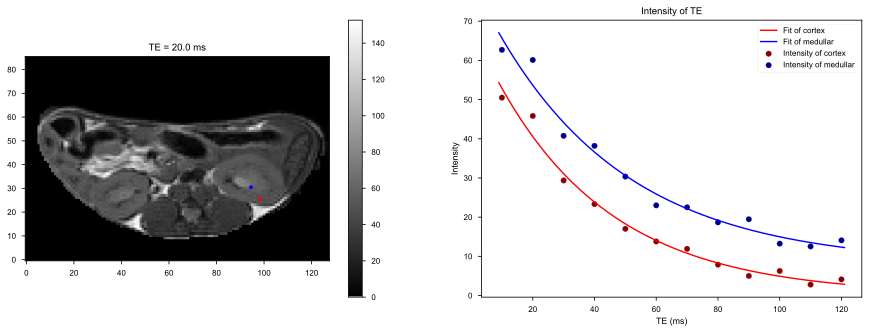

<Figure size 640x440 with 0 Axes>

In [49]:
cortex_x_pos,cortex_y_pos = 98,25
medullar_x_pos,medullar_y_pos = 94,30

cortex_color = 'red'
medullar_color = 'blue'

cortex_intensity,cortex_fit,cortex_rect=T2_fitting_point(cortex_x_pos,cortex_y_pos,cortex_color,all_echoes_slice_mask,TE_list)
medullar_intensity,medullar_fit,medullar_rect=T2_fitting_point(medullar_x_pos,medullar_y_pos,medullar_color,all_echoes_slice_mask,TE_list)

TE_fit = np.linspace(min(TE_list)-1, max(TE_list)+1, 200)

# Plot
fig, axes = plt.subplots(1,2, figsize=(15,5))

ref_index = 1
fig_ref = axes[0].imshow(all_echoes_slice_mask[ref_index,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(fig_ref,ax=axes[0])
axes[0].set_title('TE = '+str(TE_list[ref_index])+' ms')
axes[0].add_patch(cortex_rect)
axes[0].add_patch(medullar_rect)

axes[1].scatter(TE_list,cortex_intensity,color='darkred',label='Intensity of cortex')
axes[1].plot(TE_fit,cortex_fit,color=cortex_color,label='Fit of cortex')
axes[1].scatter(TE_list,medullar_intensity,color='darkblue',label='Intensity of medullar')
axes[1].plot(TE_fit,medullar_fit,color=medullar_color,label='Fit of medullar')
axes[1].set_xlabel("TE (ms)")
axes[1].set_ylabel("Intensity")
axes[1].set_title('Intensity of TE')
axes[1].legend()

plt.show()
plt.tight_layout()

In [50]:
# Fit all the pixels (about 1 min)
param_map = np.apply_along_axis(T2_fitting, 0, all_echoes_slice_mask, TE_list)
T2_map = param_map[1]

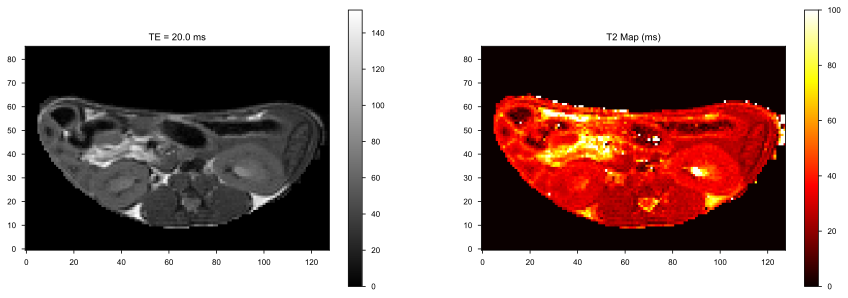

<Figure size 640x440 with 0 Axes>

In [51]:
# Plot
fig, axes = plt.subplots(1,2, figsize=(15,5))

ref_index = 1
fig_te0 = axes[0].imshow(all_echoes_slice_mask[ref_index,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(fig_te0,ax=axes[0])
axes[0].set_title('TE = '+str(TE_list[ref_index])+' ms')

fig_T2map = axes[1].imshow(T2_map, origin='lower', cmap=plt.cm.hot,vmin=0, vmax=100)
fig.colorbar(fig_T2map,ax=axes[1])
axes[1].set_title('T2 Map (ms)')

plt.show()
plt.tight_layout()

mean =  35.61538461538461
std  =  2.4973358585766046


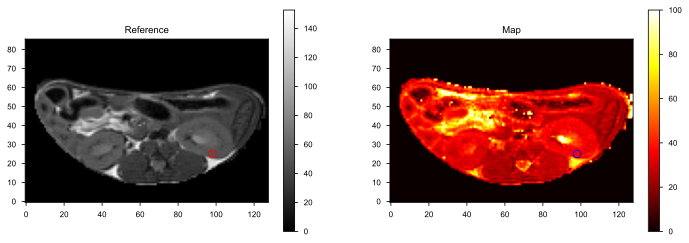

mean =  35.92307692307692
std  =  3.7098940159346134


<Figure size 640x440 with 0 Axes>

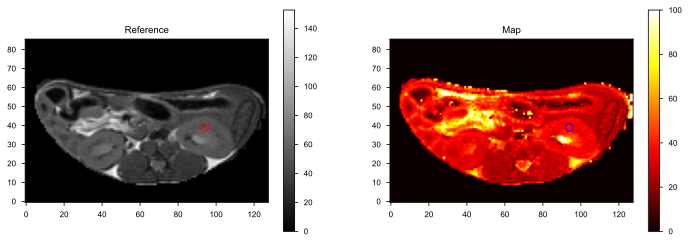

<Figure size 640x440 with 0 Axes>

In [52]:
ref_index = 1
cortex_x_pos,cortex_y_pos,cortex_radius = 98,25,2
medullar_x_pos,medullar_y_pos,medullar_radius = 94,39,2

cal_part(center_x=cortex_x_pos, center_y=cortex_y_pos, radius=cortex_radius, ref=all_echoes_slice_mask[ref_index,:,:], map=T2_map, map_max=100)
cal_part(center_x=medullar_x_pos, center_y=medullar_y_pos, radius=medullar_radius, ref=all_echoes_slice_mask[ref_index,:,:], map=T2_map, map_max=100)

# 4. 灌注成像 (Perfusion_FAIR_EPI)

16组

TI = [100, 400, 700, 1000, 1300, 1600, 1900, 2200, 2500, 2800, 3100, 3400, 3700, 4000, 4300, 4600] ms

In [53]:
data_file = 'E:\\Bolin\\94T\\Kidney-HepingCheng\\20230926_Kidney\\168\\NIFTI\\FAIR\\ChengHePing_LiJinHua_230926_LY168_E8_P1.nii.gz'
#data_file = select_data_file()

data_nii = nib.load(data_file)
TI_list = np.array([100, 400, 700, 1000, 1300, 1600, 1900, 2200, 2500, 2800, 3100, 3400, 3700, 4000, 4300, 4600],dtype=float)
print("Reading data  : ", data_file)

data = data_nii.get_fdata()
data = np.transpose(data, (3,1,0,2))
t_dim, x_dim, y_dim, z_dim = data.shape
display(data.shape)

# Read resolutions from header of data_nii
header = data_nii.header
resolution = header.get_zooms()
x_pix_dim, y_pix_dim, z_pix_dim, per_dim = resolution
print("(X,Y,Z) pix dims : ({:.2f}, {:.2f}, {:.2f}) mm".format(x_pix_dim, y_pix_dim, z_pix_dim))

Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\FAIR\ChengHePing_LiJinHua_230926_LY168_E8_P1.nii.gz


(32, 128, 128, 15)

(X,Y,Z) pix dims : (0.23, 0.23, 1.10) mm


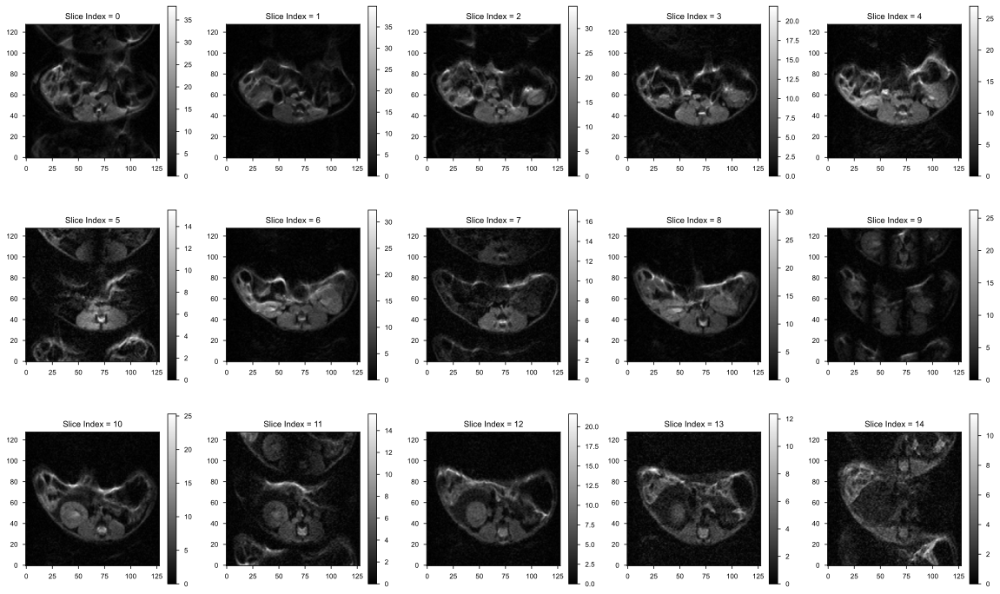

<Figure size 640x440 with 0 Axes>

In [55]:
# Show the Slices
row_set = 3
column_set = 5
fig, axes = plt.subplots(row_set,column_set, figsize=(20,12))
for i in range(z_dim):
    row = int(i // column_set)
    column = int(i - column_set*row)
    fig_s = axes[row,column].imshow(data[30,:,:,i],origin='lower', cmap=plt.cm.gray)
    fig.colorbar(fig_s,ax=axes[row,column])
    axes[row,column].set_title('Slice Index = '+str(i))

plt.show()
plt.tight_layout()
#fig.savefig('E:\\Bolin\\7T_8Tx\\Relaxation\\20230724_T1_T2\\fig\\MGE_brain1.png')

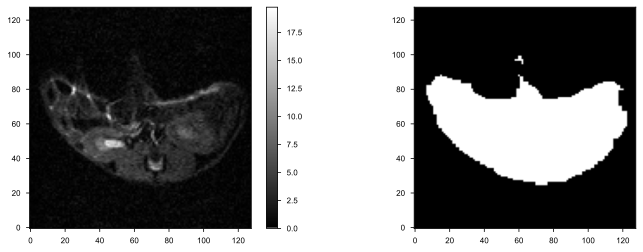

<Figure size 640x440 with 0 Axes>

In [60]:
# Plot: vmax, mask
Slice_index = 8
close_size = 7
data_slice = data[:,:,:,Slice_index]
mask = generate_mask(data_slice[0,:,:],close_size)
data_slice_mask = mask*data_slice

fig, axes = plt.subplots(1,2,figsize=(12,4))
img_0 = axes[0].imshow(data_slice[0,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(img_0,ax=axes[0])
axes[1].imshow(mask,origin='lower', cmap=plt.cm.gray)
plt.show()
plt.tight_layout()

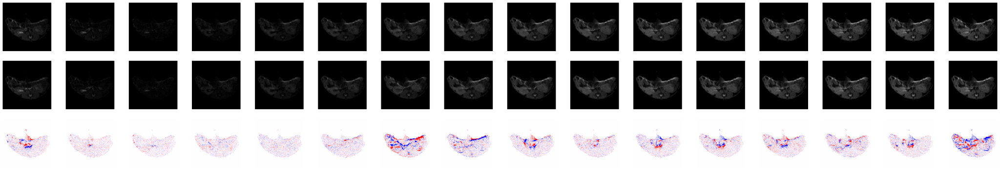

<Figure size 640x440 with 0 Axes>

In [63]:
Selective_data_slice_mask = data_slice_mask[::2,:,:]
Global_data_slice_mask = data_slice_mask[1::2,:,:]
Delta_data_slice_mask = Selective_data_slice_mask - Global_data_slice_mask

# Plot
fig, axes = plt.subplots(3,16, figsize=(48,8))
# Selective
for i in range(16):
    img = axes[0,i].imshow(Selective_data_slice_mask[i,:,:], origin='lower', cmap=plt.cm.gray, vmin=0,vmax=40)
    #fig.colorbar(img,ax=axes[0,i])
    #title = '#'+str(2*i+1)+' (Selective)'
    #axes[0,i].set_title(title)
    axes[0,i].axis('off')
# Global
for i in range(16):
    img = axes[1,i].imshow(Global_data_slice_mask[i,:,:], origin='lower', cmap=plt.cm.gray, vmin=0,vmax=40)
    #fig.colorbar(img,ax=axes[1,i])
    #title = '#'+str(2*i+2)+' (Global)'
    #axes[1,i].set_title(title)
    axes[1,i].axis('off')
# Delta
for i in range(16):
    img = axes[2,i].imshow(Delta_data_slice_mask[i,:,:], origin='lower', cmap=plt.cm.bwr, vmin=-5,vmax=5)
    #fig.colorbar(img,ax=axes[2,i])
    #title = 'Delta = Selective - Global'
    #axes[2,i].set_title(title)
    axes[2,i].axis('off')

plt.show()
plt.tight_layout()

拟合$T_1$
$$S(TI)=S_0|1-2\alpha e^{-\frac{TI}{T_1}}|$$

In [64]:
def T1_function(TI, S0, T1, alpha):
    return S0*np.abs(1-2*alpha*np.exp(-TI/T1))


def T1_fitting(Intensity_list,TI_list):
    S0_min, S0_max = 0, 100
    T1_min, T1_max = 0, 5000
    alpha_min, alpha_max = 0.5, 1.5
    initial_params = [100,5000,1]

    if Intensity_list[0]==0:
        params = [0,0,0]
    else:
        try:
            params, _ = curve_fit(T1_function, TI_list, Intensity_list, bounds=([S0_min,T1_min, alpha_min], [S0_max,T1_max, alpha_max]),p0=initial_params)
        except RuntimeError:
            params = np.full(len(initial_params), np.nan)

    return params


def T1_fitting_point(x_pos,y_pos,color,all_TIs,TI_list):
    rect = Rectangle((x_pos, y_pos), 1,1, linewidth=1, edgecolor=color, facecolor=color)
    Intensity_list = np.array([all_TIs[i,y_pos,x_pos] for i in range(len(TI_list))], dtype=float)
    S0_fit, T1_fit, alpha_fit = T1_fitting(Intensity_list,TI_list)

    # Fit curve
    print("T1 = ", T1_fit)
    print("S0 = ", S0_fit)
    print("alpha = ", alpha_fit)
    print('\n')
    TI_fit = np.linspace(min(TI_list)-10, max(TI_list)+10, 200)
    Intensity_fit = T1_function(TI_fit, S0_fit, T1_fit, alpha_fit)
    
    return Intensity_list,Intensity_fit,rect


T1 =  1664.5786912298322
S0 =  14.423220121714937
alpha =  0.7313485489318294


T1 =  2215.809916424527
S0 =  17.55629742764033
alpha =  0.7697386965802645


T1 =  1383.7122558992123
S0 =  13.628149954684508
alpha =  0.7521906423493971


T1 =  1825.8123848938262
S0 =  16.57304242228716
alpha =  0.8502125457416433




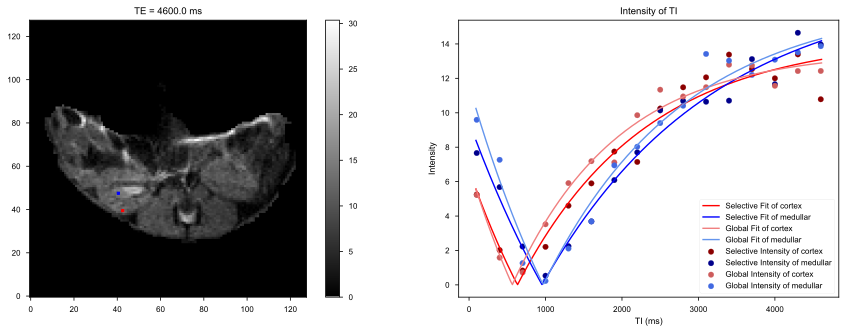

<Figure size 640x440 with 0 Axes>

In [70]:
cortex_x_pos,cortex_y_pos = 42,39
medullar_x_pos,medullar_y_pos = 40,47

cortex_color = 'red'
medullar_color = 'blue'

# Selective Fitting
cortex_selective_intensity,cortex_selective_fit,cortex_selective_rect=T1_fitting_point(cortex_x_pos,cortex_y_pos,cortex_color,Selective_data_slice_mask,TI_list)
medullar_selective_intensity,medullar_selective_fit,medullar_selective_rect=T1_fitting_point(medullar_x_pos,medullar_y_pos,medullar_color,Selective_data_slice_mask,TI_list)

# Global Fitting
cortex_global_intensity,cortex_global_fit,cortex_global_rect=T1_fitting_point(cortex_x_pos,cortex_y_pos,cortex_color,Global_data_slice_mask,TI_list)
medullar_global_intensity,medullar_global_fit,medullar_global_rect=T1_fitting_point(medullar_x_pos,medullar_y_pos,medullar_color,Global_data_slice_mask,TI_list)

TI_fit = np.linspace(min(TI_list)-10, max(TI_list)+10, 200)

# Plot
fig, axes = plt.subplots(1,2, figsize=(15,5))

ref_index = -1
fig_ref = axes[0].imshow(Selective_data_slice_mask[ref_index,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(fig_ref,ax=axes[0])
axes[0].set_title('TE = '+str(TI_list[ref_index])+' ms')
axes[0].add_patch(cortex_selective_rect)
axes[0].add_patch(medullar_selective_rect)

# Selective
axes[1].scatter(TI_list,cortex_selective_intensity,color='darkred',label='Selective Intensity of cortex')
axes[1].plot(TI_fit,cortex_selective_fit,color='red',label='Selective Fit of cortex')
axes[1].scatter(TI_list,medullar_selective_intensity,color='darkblue',label='Selective Intensity of medullar')
axes[1].plot(TI_fit,medullar_selective_fit,color='blue',label='Selective Fit of medullar')

# Global
axes[1].scatter(TI_list,cortex_global_intensity,color='indianred',label='Global Intensity of cortex')
axes[1].plot(TI_fit,cortex_global_fit,color='lightcoral',label='Global Fit of cortex')
axes[1].scatter(TI_list,medullar_global_intensity,color='royalblue',label='Global Intensity of medullar')
axes[1].plot(TI_fit,medullar_global_fit,color='cornflowerblue',label='Global Fit of medullar')

axes[1].set_xlabel("TI (ms)")
axes[1].set_ylabel("Intensity")
axes[1].set_title('Intensity of TI')
axes[1].legend()

plt.show()
plt.tight_layout()

In [71]:
# Fit all the pixels (about 1 min)
Selective_param_map = np.apply_along_axis(T1_fitting, 0, Selective_data_slice_mask, TI_list)
Selective_T1_map = Selective_param_map[1]

Global_param_map = np.apply_along_axis(T1_fitting, 0, Global_data_slice_mask, TI_list)
Global_T1_map = Global_param_map[1]

Renal Blood Flow, RBF 单位 mL/1 g tissue/ms
$$\text{RBF} = \frac{\lambda}{T_{1,\text{blood}}}\left(\frac{T_{1,\text{global}}}{T_{1,\text{selective}}}-1\right)$$
Blood-tissue partition coefficient
$$\lambda = 0.8$$
$$T_{1,\text{blood}} = 2430 \text{ ms}$$
单位换成mL/100 g tissue/min要乘以6000000

In [72]:
T1_blood = 2430
lam = 0.8
RBF_map = lam/T1_blood*(Global_T1_map/Selective_T1_map-1)*6*1e6
#RBF_map = np.clip(RBF_map,0,1000)*mask


C:\Users\pkucm\AppData\Local\Temp\ipykernel_4624\900315496.py:3: RuntimeWarning: divide by zero encountered in divide
  RBF_map = lam/T1_blood*(Global_T1_map/Selective_T1_map-1)*6*1e6
C:\Users\pkucm\AppData\Local\Temp\ipykernel_4624\900315496.py:3: RuntimeWarning: invalid value encountered in divide
  RBF_map = lam/T1_blood*(Global_T1_map/Selective_T1_map-1)*6*1e6


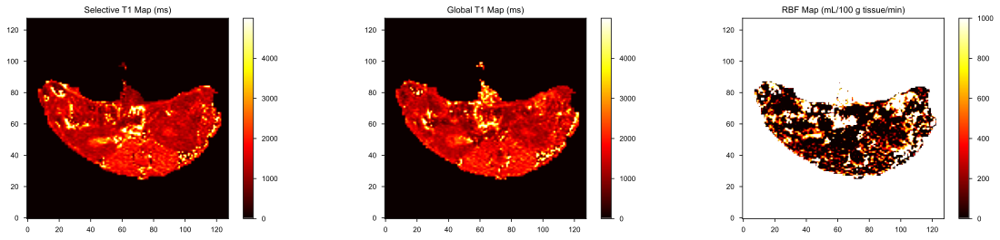

<Figure size 640x440 with 0 Axes>

In [73]:
# Plot
fig, axes = plt.subplots(1,3, figsize=(20,4))

#axes[0].set_title('z = '+str(slice_num)+', #1')
#img = axes[0].imshow(img_0, origin='lower', cmap=plt.cm.gray)
#fig.colorbar(img,ax=axes[0])

axes[0].set_title('Selective T1 Map (ms)')
img_sel_T1 = axes[0].imshow(Selective_T1_map, origin='lower', cmap=plt.cm.hot)
fig.colorbar(img_sel_T1,ax=axes[0])

axes[1].set_title('Global T1 Map (ms)')
img_glo_T1 = axes[1].imshow(Global_T1_map, origin='lower', cmap=plt.cm.hot)
fig.colorbar(img_glo_T1,ax=axes[1])

axes[2].set_title('RBF Map (mL/100 g tissue/min)')
img_rbf = axes[2].imshow(RBF_map, origin='lower', cmap=plt.cm.hot, vmin = 0, vmax = 1000)
fig.colorbar(img_rbf,ax=axes[2])

plt.show()
plt.tight_layout()

# 5. 扩散磁共振成像 (Diffusion)
$$S=S_0\exp(-bx^TDx)$$
b = 0, 100, 200, 400, 600, 1000


bvec1 = [1,0,0]

bvec2 = [0,1,0]

bvec3 = [0,0,1]



In [74]:
data_file = 'E:\\Bolin\\94T\\Kidney-HepingCheng\\20230926_Kidney\\168\\NIFTI\\DWI\\ChengHePing_LiJinHua_230926_LY168_E7_P1.nii.gz'
#data_file = select_data_file()

data_nii = nib.load(data_file)
print("Reading data  : ", data_file)
b_list = np.array([0,100,200,400,600,1000],dtype=float)
data = data_nii.get_fdata()
data = np.transpose(data, (3,1,0,2))
t_dim, x_dim, y_dim, z_dim = data.shape
display(data.shape)

# Read resolutions from header of data_nii
header = data_nii.header
resolution = header.get_zooms()
x_pix_dim, y_pix_dim, z_pix_dim, d_dim = resolution
print("(X,Y,Z) pix dims : ({:.2f}, {:.2f}, {:.2f}) mm".format(x_pix_dim, y_pix_dim, z_pix_dim))

Reading data  :  E:\Bolin\94T\Kidney-HepingCheng\20230926_Kidney\168\NIFTI\DWI\ChengHePing_LiJinHua_230926_LY168_E7_P1.nii.gz


(16, 128, 128, 15)

(X,Y,Z) pix dims : (0.23, 0.23, 1.00) mm


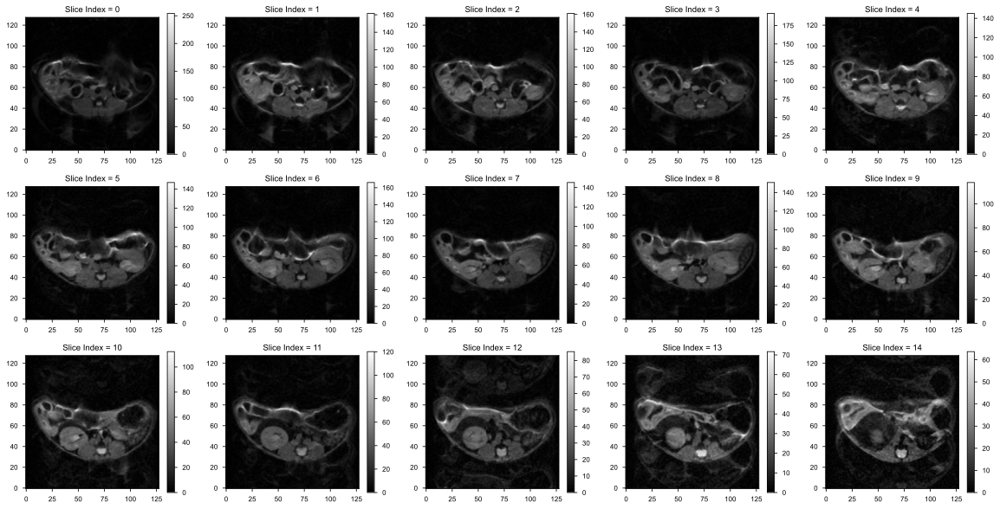

<Figure size 640x440 with 0 Axes>

In [75]:
# Show the Slices
row_set = 3
column_set = 5
fig, axes = plt.subplots(row_set,column_set, figsize=(20,10))
for i in range(z_dim):
    row = int(i // column_set)
    column = int(i - column_set*row)
    fig_s = axes[row,column].imshow(data[0,:,:,i],origin='lower', cmap=plt.cm.gray)
    fig.colorbar(fig_s,ax=axes[row,column])
    axes[row,column].set_title('Slice Index = '+str(i))

plt.show()
plt.tight_layout()
#fig.savefig('E:\\Bolin\\7T_8Tx\\Relaxation\\20230724_T1_T2\\fig\\MGE_brain1.png')

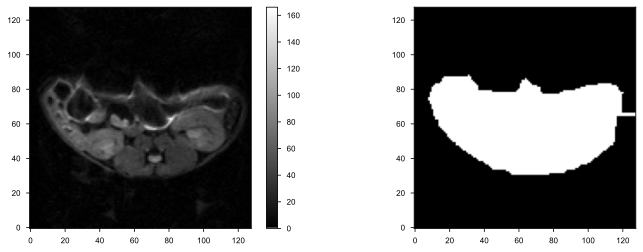

<Figure size 640x440 with 0 Axes>

In [77]:
# Plot: vmax, mask
Slice_index = 6
close_size = 10
data_slice = data[:,:,:,Slice_index]
mask = generate_mask(data_slice[0,:,:],close_size)
data_slice_mask = mask*data_slice

fig, axes = plt.subplots(1,2,figsize=(12,4))
img_0 = axes[0].imshow(data_slice[0,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(img_0,ax=axes[0])
axes[1].imshow(mask,origin='lower', cmap=plt.cm.gray)
plt.show()
plt.tight_layout()

In [84]:
# DWI of different b-value
b0_data = data_slice_mask[0,:,:]
data_slice_x = data_slice_mask[:6,:,:]

data_slice_y = np.zeros((6,x_dim,y_dim))
data_slice_y[0,:,:] = b0_data
data_slice_y[1:6,:,:] = data_slice_mask[6:11,:,:]

data_slice_z = np.zeros((6,x_dim,y_dim))
data_slice_z[0,:,:] = b0_data
data_slice_z[1:6,:,:] = data_slice_mask[11:16,:,:]


In [51]:
display(data_slice_x.shape)

(6, 128, 128)

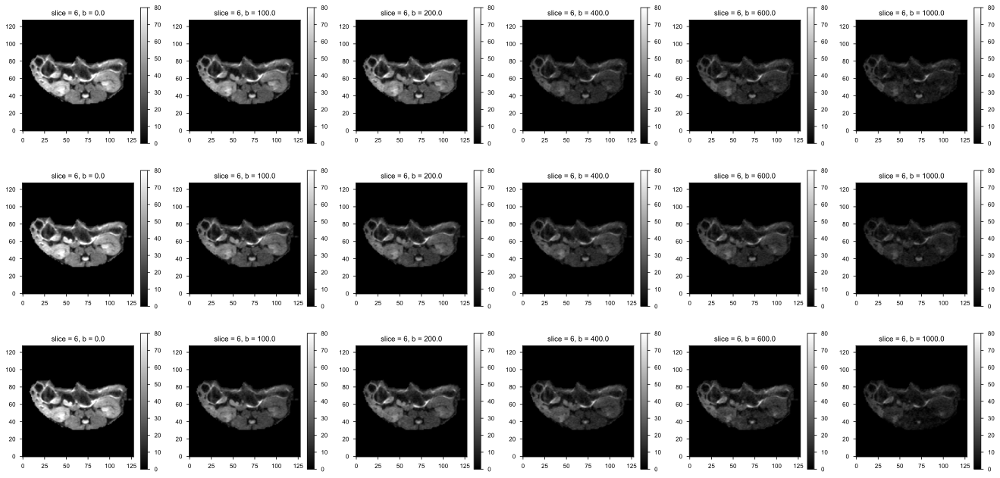

<Figure size 640x440 with 0 Axes>

In [85]:
# Plot
fig, axes = plt.subplots(3,6, figsize=(23,11))
for i in range(6):
    img = axes[0,i].imshow(data_slice_x[i,:,:],origin='lower', cmap=plt.cm.gray, vmin = 0, vmax = 80)
    fig.colorbar(img,ax=axes[0,i])
    title = 'slice = '+str(Slice_index)+', b = '+str(b_list[i])
    axes[0,i].set_title(title)

    img = axes[1,i].imshow(data_slice_y[i,:,:],origin='lower', cmap=plt.cm.gray, vmin = 0, vmax = 80)
    fig.colorbar(img,ax=axes[1,i])
    title = 'slice = '+str(Slice_index)+', b = '+str(b_list[i])
    axes[1,i].set_title(title)

    img = axes[2,i].imshow(data_slice_z[i,:,:],origin='lower', cmap=plt.cm.gray, vmin = 0, vmax = 80)
    fig.colorbar(img,ax=axes[2,i])
    title = 'slice = '+str(Slice_index)+', b = '+str(b_list[i])
    axes[2,i].set_title(title)

plt.show()
plt.tight_layout()

拟合D
$$S=S_0\exp(-bD)+c$$

In [86]:
def D_function(b, S0, D, const):
    return S0*np.exp(-b*D*1e-6)+const


def D_fitting(Intensity_list,b_list):
    S0_min, S0_max = 0, 1000
    D_min, D_max = 0,10000
    const_min, const_max = -5, 5
    initial_params = [50, 4000, 0]

    if Intensity_list[0]==0:
        params = [0,0,0]
    else:
        try:
            params, _ = curve_fit(D_function, b_list, Intensity_list, bounds=([S0_min,D_min, const_min], [S0_max,D_max, const_max]),p0=initial_params)
        except RuntimeError:
            params = np.full(len(initial_params), np.nan)

    return params


def D_fitting_point(x_pos,y_pos,color,all_dwi,b_list):
    rect = Rectangle((x_pos, y_pos), 1,1, linewidth=1, edgecolor=color, facecolor=color)
    Intensity_list = np.array([all_dwi[i,y_pos,x_pos] for i in range(len(b_list))], dtype=float)
    S0_fit, D_fit, const_fit = D_fitting(Intensity_list,b_list)

    # Fit curve
    print("D = ", D_fit)
    print("S0 = ", S0_fit)
    print("const = ", D_fit)
    print('\n')
    b_fit = np.linspace(min(b_list)-50, max(b_list)+50, 200)
    Intensity_fit = D_function(b_fit, S0_fit, D_fit, const_fit)
    
    return Intensity_list,Intensity_fit,rect


D =  2894.048785628729
S0 =  38.88191314469762
const =  2894.048785628729


D =  2932.7646316020437
S0 =  60.831603303322794
const =  2932.7646316020437




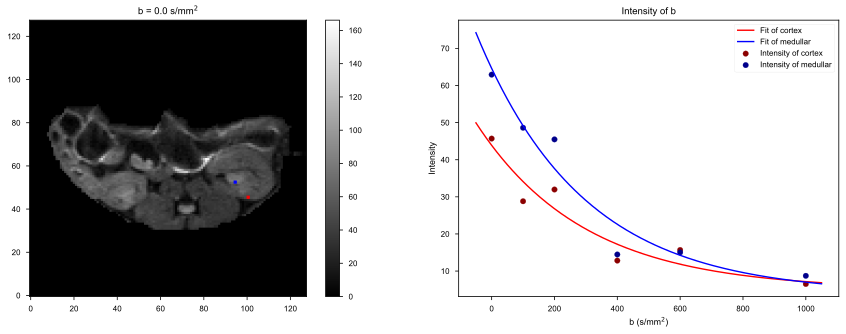

<Figure size 640x440 with 0 Axes>

In [87]:
cortex_x_pos,cortex_y_pos = 100,45
medullar_x_pos,medullar_y_pos = 94,52

cortex_color = 'red'
medullar_color = 'blue'

cortex_intensity,cortex_fit,cortex_rect=D_fitting_point(cortex_x_pos,cortex_y_pos,cortex_color,data_slice_x,b_list)
medullar_intensity,medullar_fit,medullar_rect=D_fitting_point(medullar_x_pos,medullar_y_pos,medullar_color,data_slice_x,b_list)

b_fit = np.linspace(min(b_list)-50, max(b_list)+50, 200)

# Plot
fig, axes = plt.subplots(1,2, figsize=(15,5))

ref_index = 0
fig_ref = axes[0].imshow(data_slice_x[ref_index,:,:], origin='lower', cmap=plt.cm.gray)
fig.colorbar(fig_ref,ax=axes[0])
axes[0].set_title('b = '+str(b_list[ref_index])+' s/mm$^2$')
axes[0].add_patch(cortex_rect)
axes[0].add_patch(medullar_rect)

axes[1].scatter(b_list,cortex_intensity,color='darkred',label='Intensity of cortex')
axes[1].plot(b_fit,cortex_fit,color=cortex_color,label='Fit of cortex')
axes[1].scatter(b_list,medullar_intensity,color='darkblue',label='Intensity of medullar')
axes[1].plot(b_fit,medullar_fit,color=medullar_color,label='Fit of medullar')
axes[1].set_xlabel("b (s/mm$^2$)")
axes[1].set_ylabel("Intensity")
axes[1].set_title('Intensity of b')
axes[1].legend()

plt.show()
plt.tight_layout()

In [88]:
# Fit all the pixels (about 1 min)
x_param_map = np.apply_along_axis(D_fitting, 0, data_slice_x, b_list)
Dx_map = x_param_map[1]

y_param_map = np.apply_along_axis(D_fitting, 0, data_slice_y, b_list)
Dy_map = y_param_map[1]

z_param_map = np.apply_along_axis(D_fitting, 0, data_slice_z, b_list)
Dz_map = z_param_map[1]

ADC_map = (Dx_map + Dy_map + Dz_map)/3

d:\Downloads\anaconda3\anaconda3\envs\mri_env\lib\site-packages\numpy\lib\shape_base.py:402: RuntimeWarning: invalid value encountered in cast
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


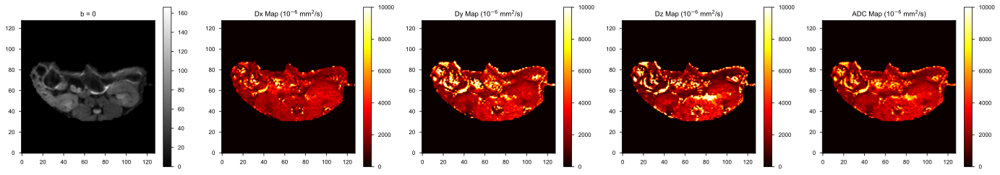

<Figure size 640x440 with 0 Axes>

In [89]:
# Plot
fig, axes = plt.subplots(1,5, figsize=(24,4))

axes[0].set_title('b = 0')
img_b0 = axes[0].imshow(b0_data, origin='lower', cmap=plt.cm.gray)
fig.colorbar(img_b0,ax=axes[0])

axes[1].set_title('Dx Map (10$^{-6}$ mm$^2$/s)')
img_Dx = axes[1].imshow(Dx_map, origin='lower', cmap=plt.cm.hot,vmin=0,vmax=10000)
fig.colorbar(img_Dx,ax=axes[1])

axes[2].set_title('Dy Map (10$^{-6}$ mm$^2$/s)')
img_Dy = axes[2].imshow(Dy_map, origin='lower', cmap=plt.cm.hot,vmin=0,vmax=10000)
fig.colorbar(img_Dy,ax=axes[2])

axes[3].set_title('Dz Map (10$^{-6}$ mm$^2$/s)')
img_Dz = axes[3].imshow(Dz_map, origin='lower', cmap=plt.cm.hot,vmin=0,vmax=10000)
fig.colorbar(img_Dz,ax=axes[3])

axes[4].set_title('ADC Map (10$^{-6}$ mm$^2$/s)')
img_ADC = axes[4].imshow(ADC_map, origin='lower', cmap=plt.cm.hot,vmin=0,vmax=10000)
fig.colorbar(img_ADC,ax=axes[4])

plt.show()
plt.tight_layout()

mean =  1808.144696380729
std  =  121.33169139845151


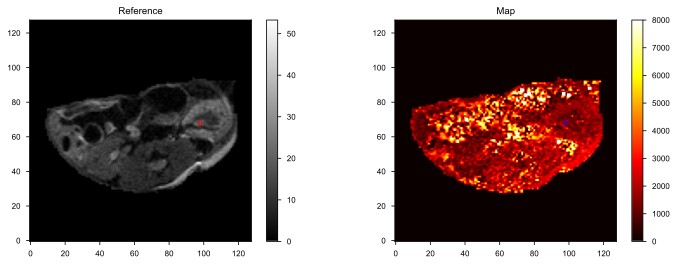

<Figure size 640x440 with 0 Axes>

In [111]:
cal_part(center_x=98, center_y=68, radius=1, ref=b0_dwi, map=ADC_map, map_max=8000)